In [1]:
import cv2
import numpy as np
from skimage.feature import hog
import matplotlib.pyplot as plt
import os
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model

image_dir = '/content/drive/MyDrive/Smile_images_resized'
# Load images
def load_images(image_dir):
    image_paths = [os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.png')]
    images = []
    for path in image_paths:
        image = cv2.imread(path)
        images.append(image)
    return images, image_paths

images, image_paths = load_images(image_dir)

print(f"Loaded {len(images)} images.")

Loaded 70 images.


In [2]:
# Load VGG16 model pre-trained on ImageNet
base_model = VGG16(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('block5_conv3').output)

# Preprocess images and extract features
def extract_features(images):
    features = []
    for image in images:
        img = cv2.resize(image, (224, 224))
        img = preprocess_input(np.expand_dims(img, axis=0))
        feature = model.predict(img)
        features.append(feature.flatten())
    return np.array(features)

features = extract_features(images)
print("Features extracted.")


1/1 [==============================] - 0s 459ms/step
Features extracted.


In [3]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Assuming labels are provided separately for training purposes
# For demonstration, we create dummy labels
labels = np.random.randint(0, 2, len(images))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train a classifier
classifier = SVC(kernel='linear')
classifier.fit(X_train, y_train)

# Test the classifier
y_pred = classifier.predict(X_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:")
print(report)


Accuracy: 0.43
Classification Report:
              precision    recall  f1-score   support

           0       0.40      0.29      0.33         7
           1       0.44      0.57      0.50         7

    accuracy                           0.43        14
   macro avg       0.42      0.43      0.42        14
weighted avg       0.42      0.43      0.42        14



1/1 [==============================] - 1s 802ms/step
Image: 11.png is More Smiling


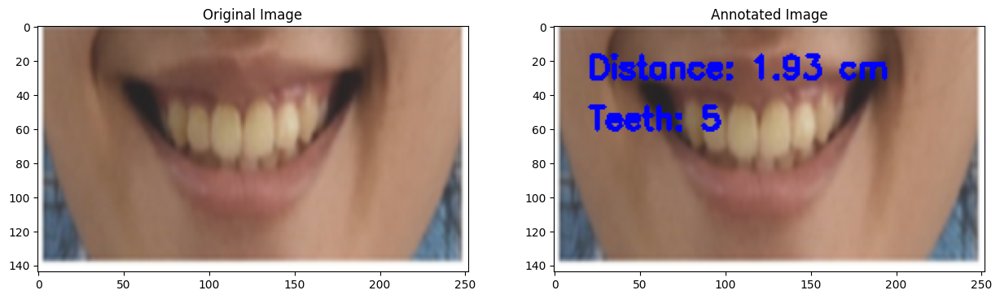

1/1 [==============================] - 1s 833ms/step
Image: 17.png is More Smiling


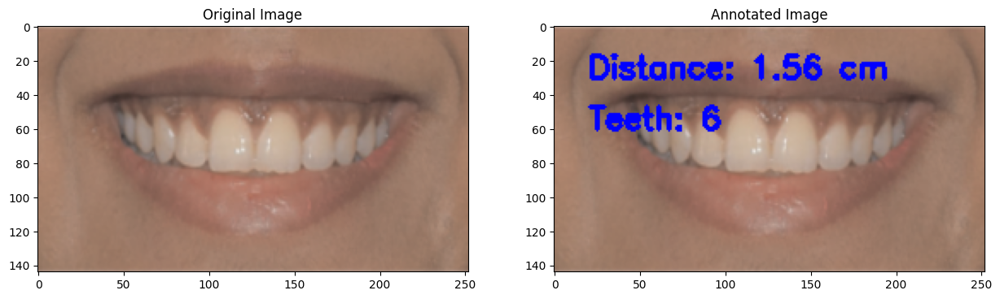

1/1 [==============================] - 1s 866ms/step
Image: 12.png is More Smiling


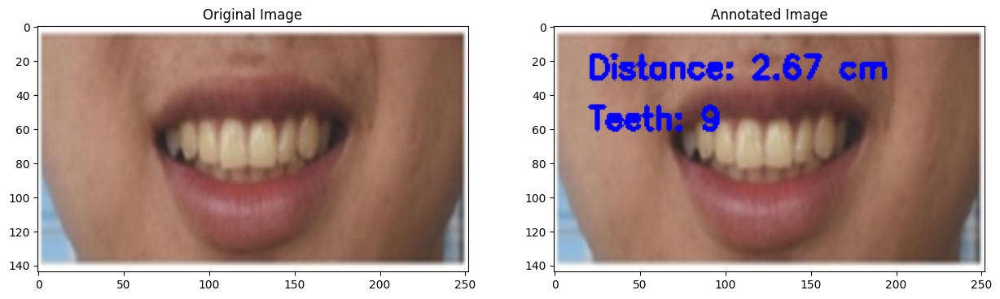

1/1 [==============================] - 2s 2s/step
Image: 2.png is More Smiling


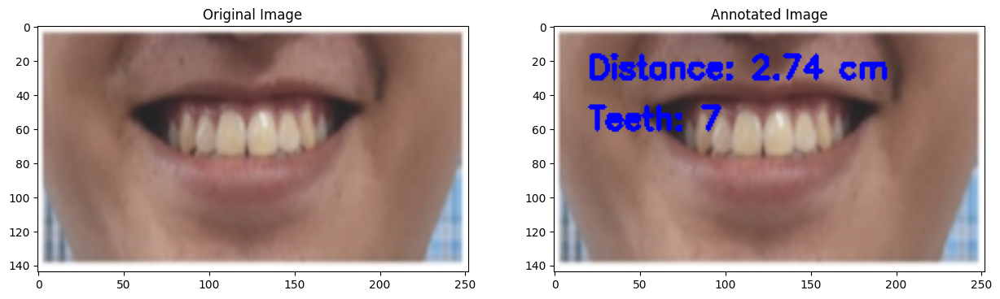

1/1 [==============================] - 1s 990ms/step
Image: 22.png is Less Smiling


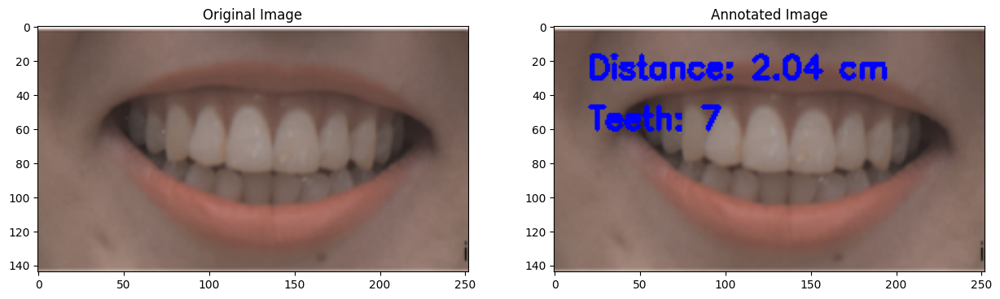

1/1 [==============================] - 1s 935ms/step
Image: 14.png is More Smiling


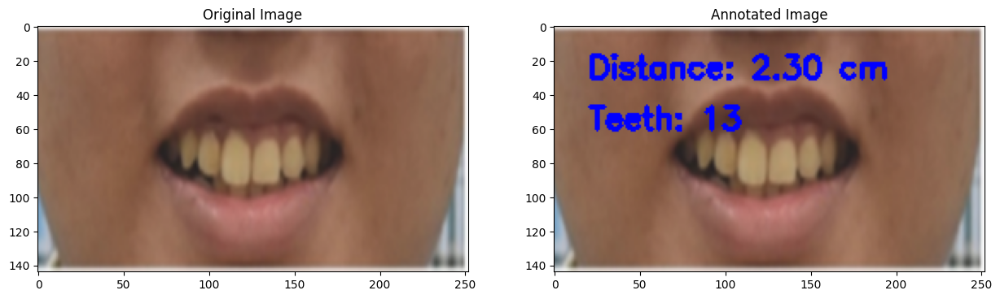

1/1 [==============================] - 0s 496ms/step
Image: 10.png is Less Smiling


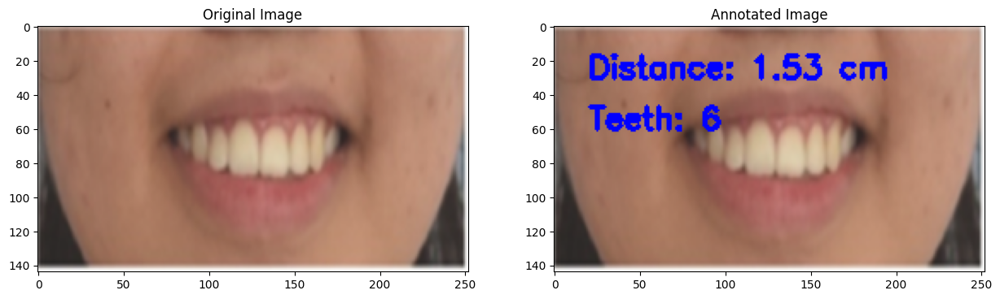

1/1 [==============================] - 0s 491ms/step
Image: 6.png is Less Smiling


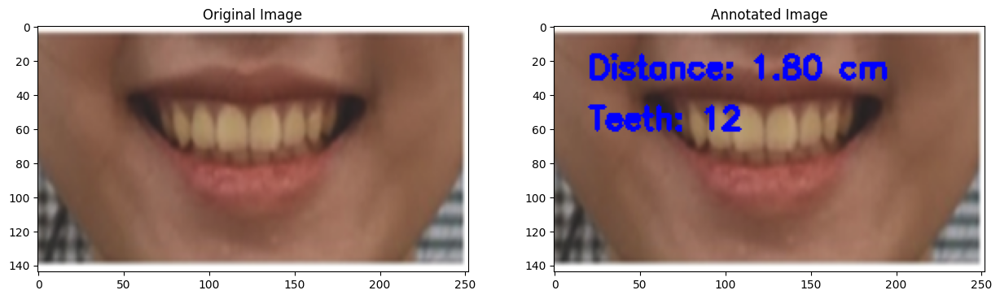

1/1 [==============================] - 0s 480ms/step
Image: 1.png is Less Smiling


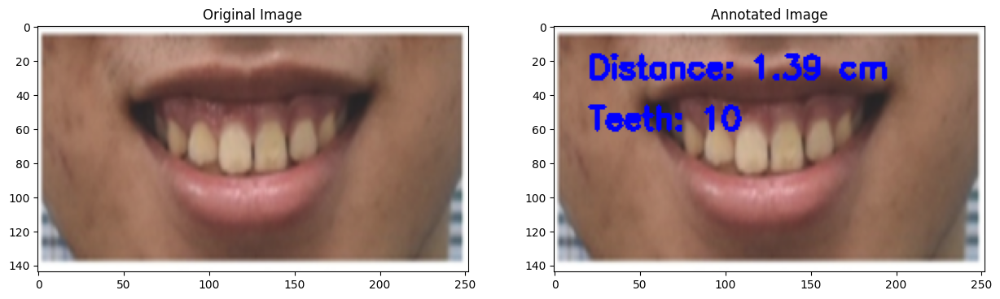

1/1 [==============================] - 0s 478ms/step
Image: 5.png is More Smiling


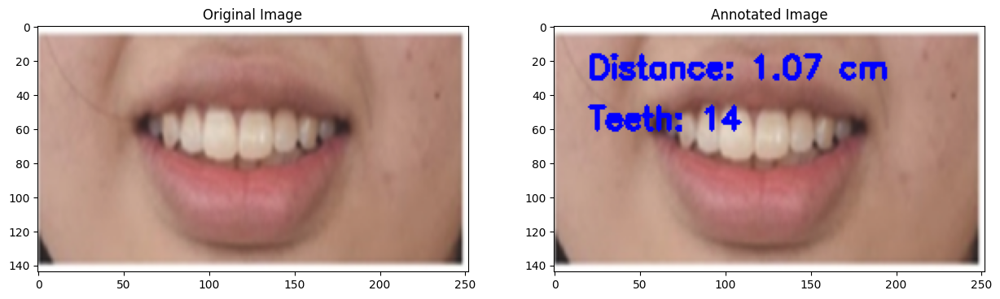

1/1 [==============================] - 0s 478ms/step
Image: 9.png is More Smiling


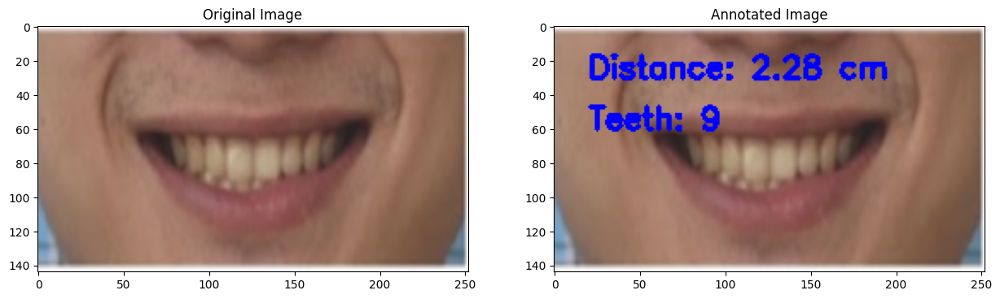

1/1 [==============================] - 1s 690ms/step
Image: 19.png is More Smiling


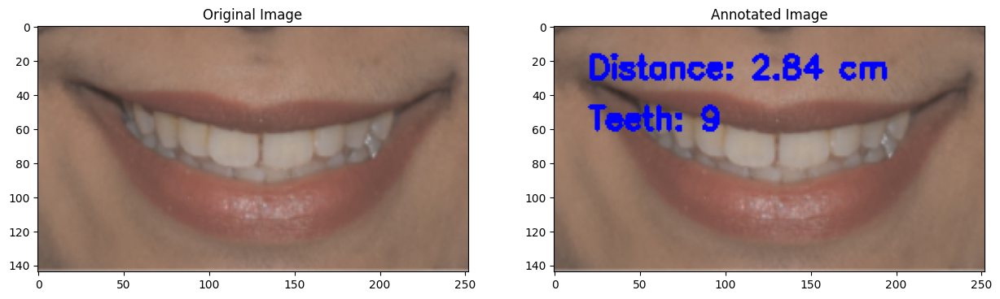

1/1 [==============================] - 1s 868ms/step
Image: 20.png is More Smiling


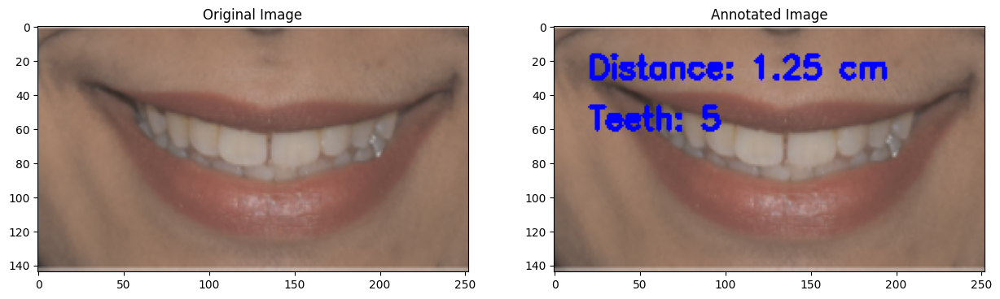

1/1 [==============================] - 1s 833ms/step
Image: 8.png is More Smiling


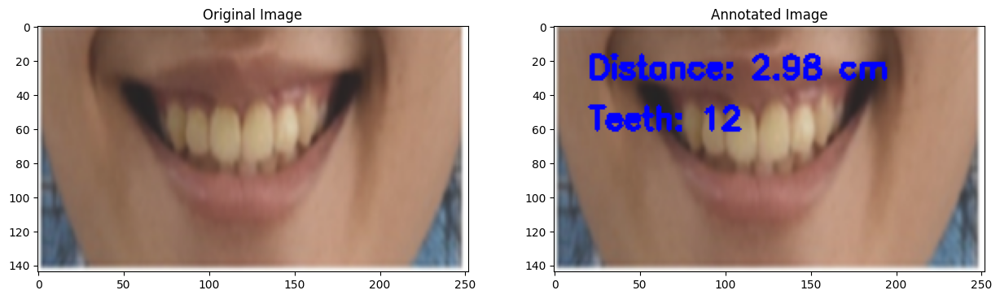

1/1 [==============================] - 1s 728ms/step
Image: 15.png is More Smiling


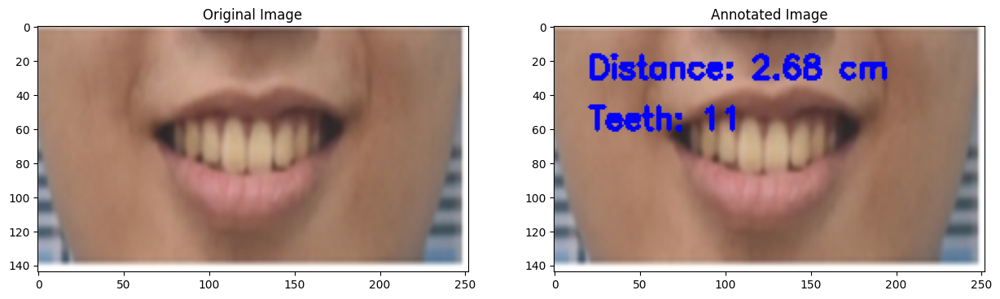

1/1 [==============================] - 0s 473ms/step
Image: 18.png is Less Smiling


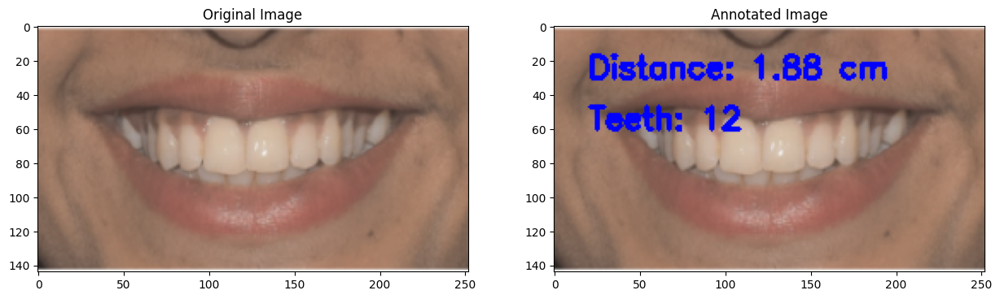

1/1 [==============================] - 0s 482ms/step
Image: 16.png is More Smiling


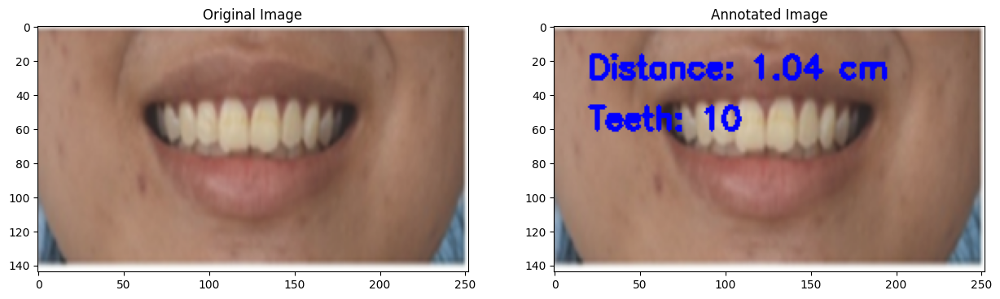

1/1 [==============================] - 0s 490ms/step
Image: 7.png is Less Smiling


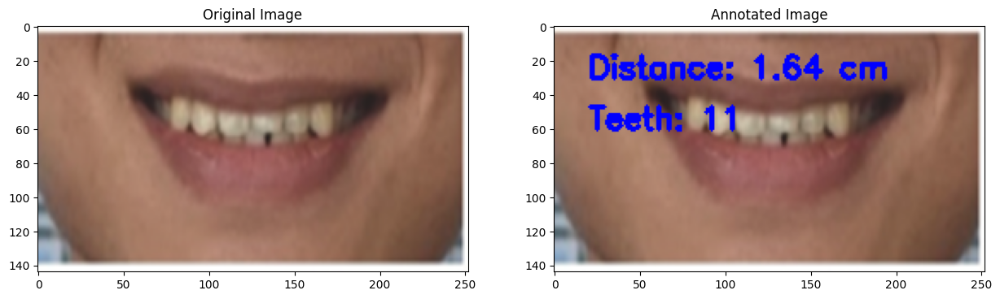

1/1 [==============================] - 0s 491ms/step
Image: 13.png is Less Smiling


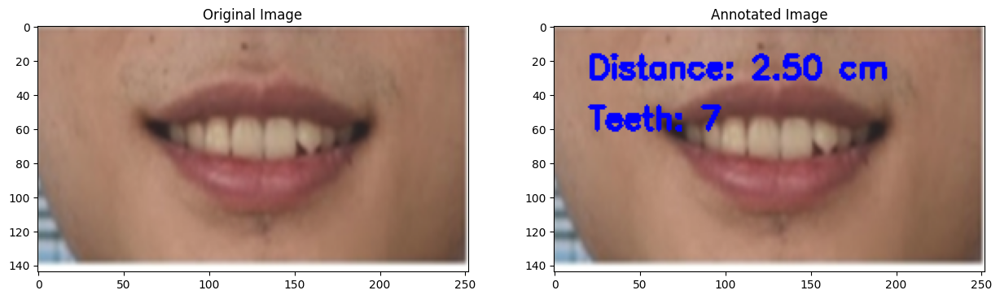

1/1 [==============================] - 0s 484ms/step
Image: 21.png is Less Smiling


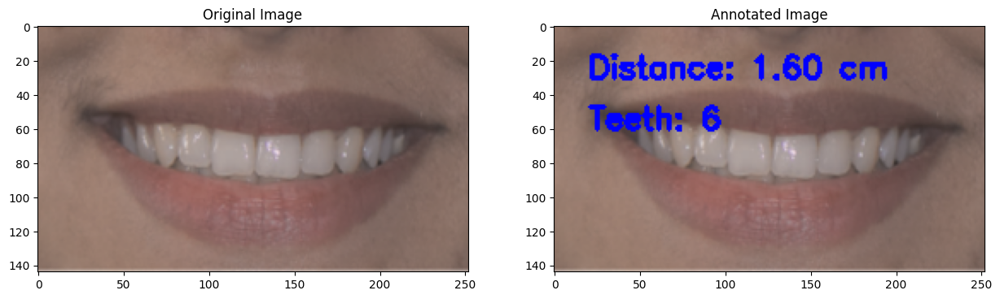

1/1 [==============================] - 0s 498ms/step
Image: 3.png is Less Smiling


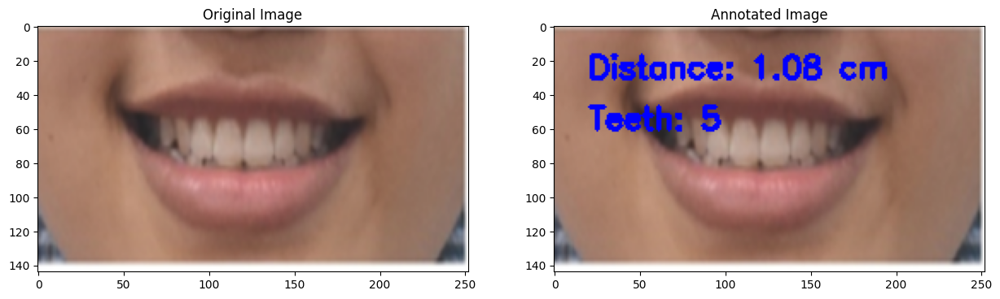

1/1 [==============================] - 0s 498ms/step
Image: 4.png is Less Smiling


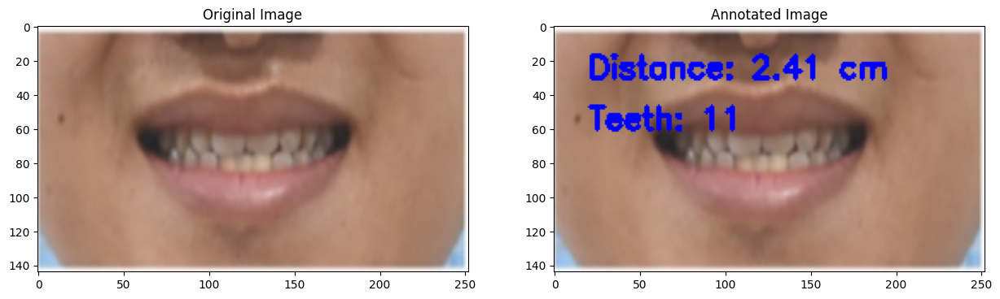

1/1 [==============================] - 1s 558ms/step
Image: 42.png is More Smiling


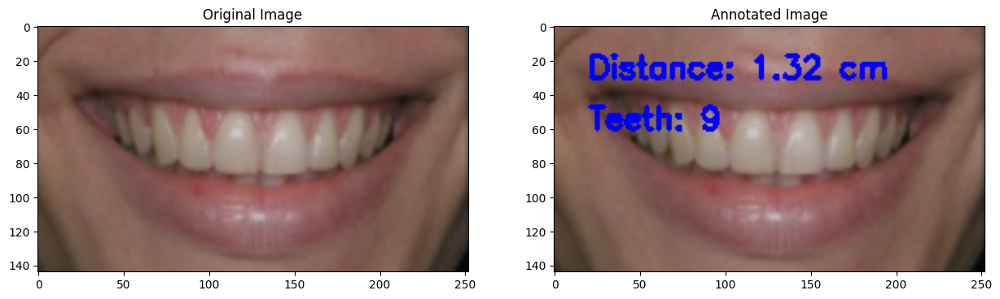

1/1 [==============================] - 1s 875ms/step
Image: 39.png is More Smiling


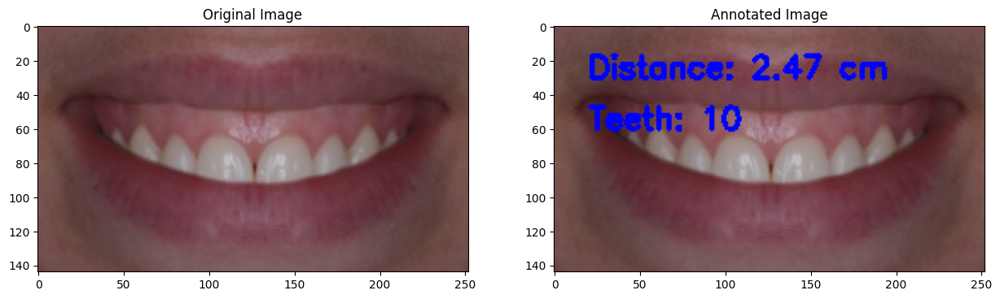

1/1 [==============================] - 1s 799ms/step
Image: 28.png is More Smiling


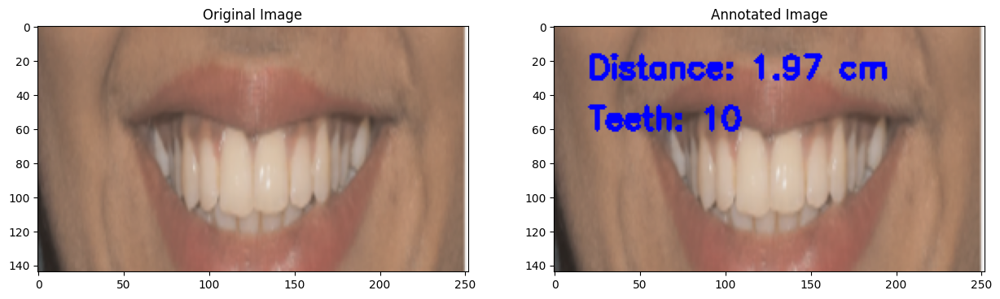

1/1 [==============================] - 1s 799ms/step
Image: 52.png is Less Smiling


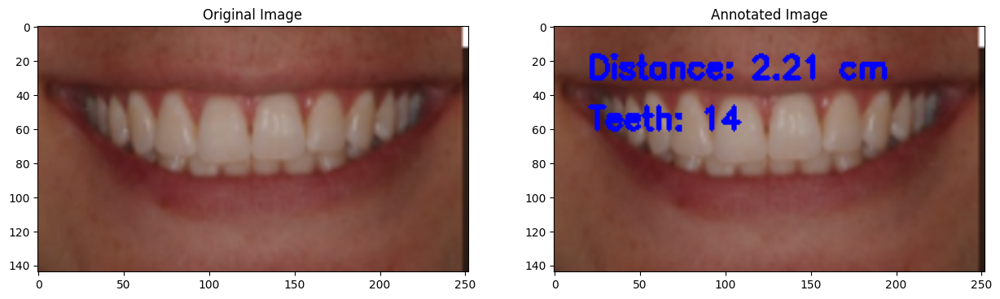

1/1 [==============================] - 0s 491ms/step
Image: 41.png is More Smiling


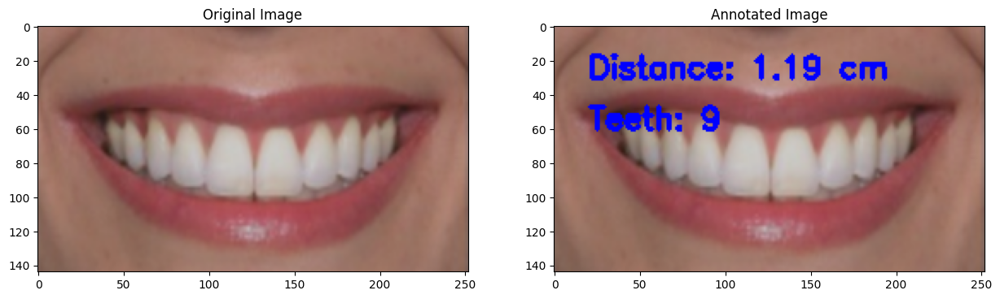

1/1 [==============================] - 1s 500ms/step
Image: 34.png is More Smiling


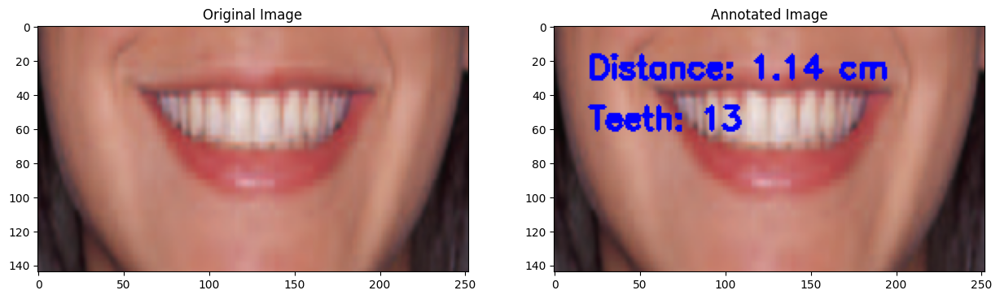

1/1 [==============================] - 1s 502ms/step
Image: 27.png is Less Smiling


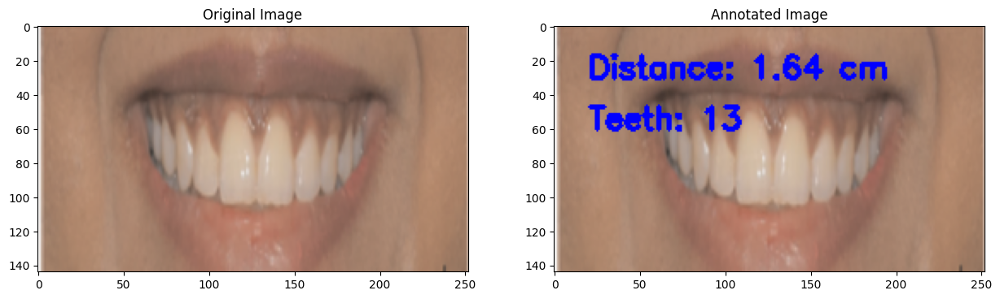

1/1 [==============================] - 1s 500ms/step
Image: 23.png is More Smiling


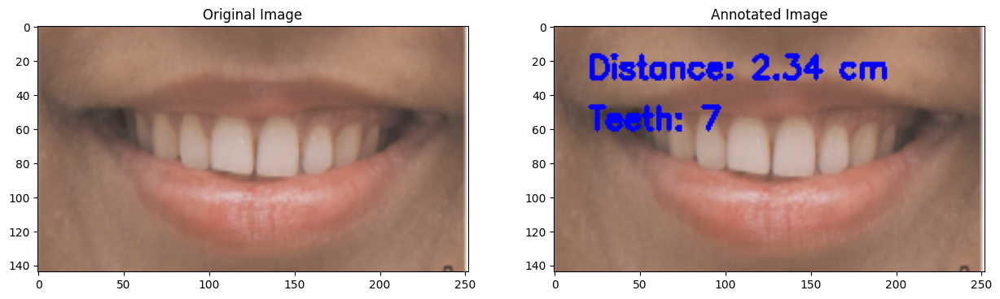

1/1 [==============================] - 0s 491ms/step
Image: 46.png is More Smiling


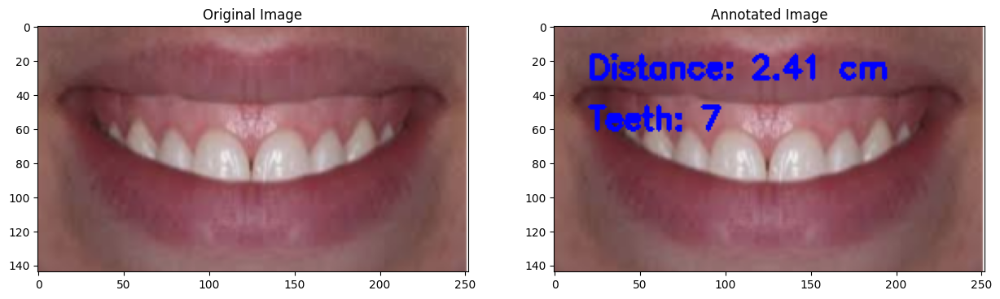

1/1 [==============================] - 0s 494ms/step
Image: 29.png is More Smiling


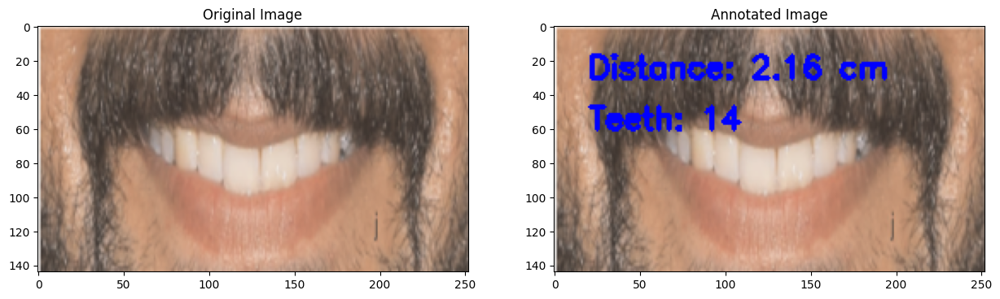

1/1 [==============================] - 1s 546ms/step
Image: 26.png is More Smiling


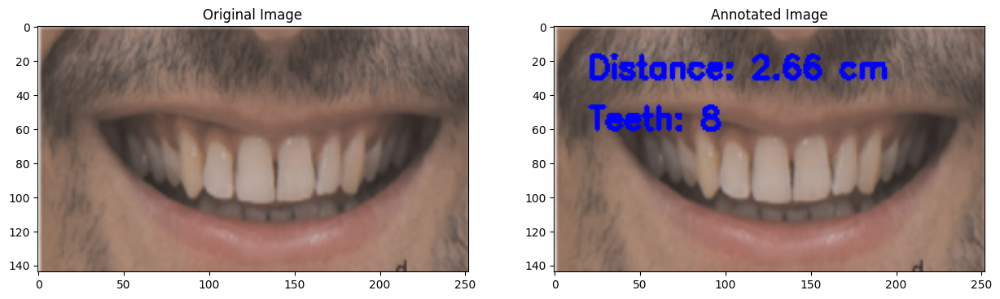

1/1 [==============================] - 1s 700ms/step
Image: 33.png is More Smiling


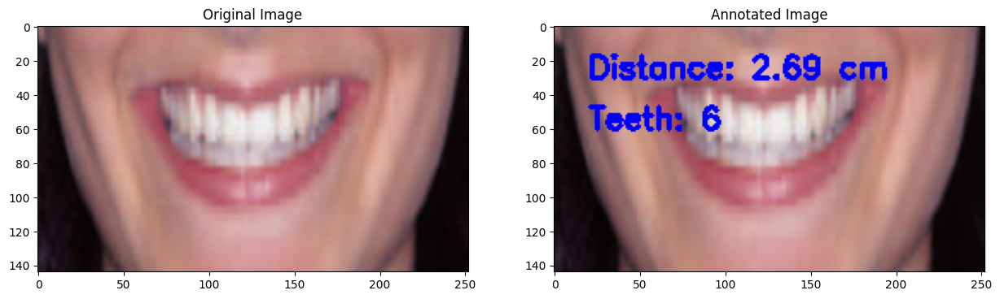

1/1 [==============================] - 1s 834ms/step
Image: 36.png is More Smiling


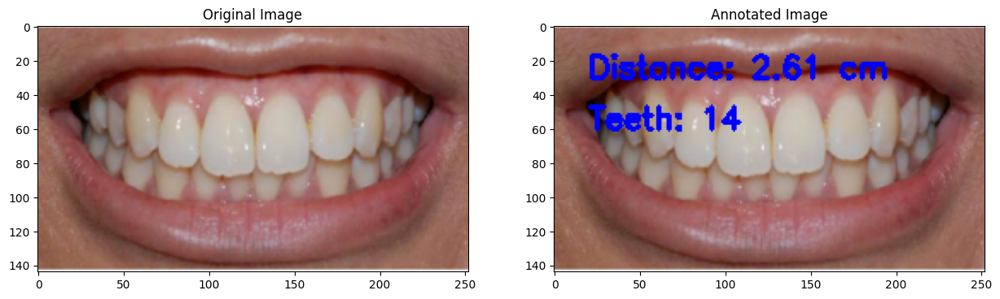

1/1 [==============================] - 1s 846ms/step
Image: 49.png is Less Smiling


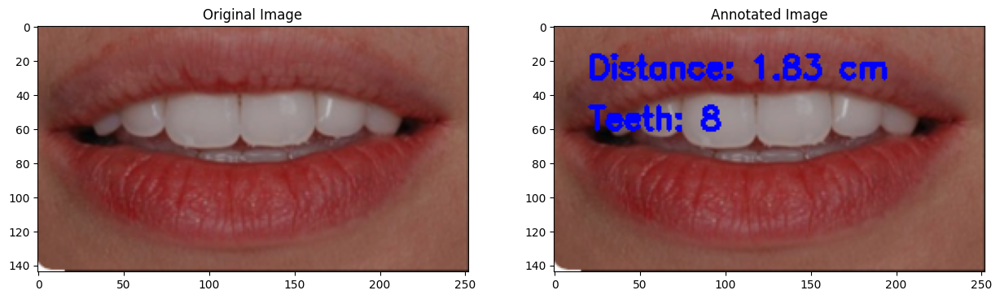

1/1 [==============================] - 1s 604ms/step
Image: 45.png is Less Smiling


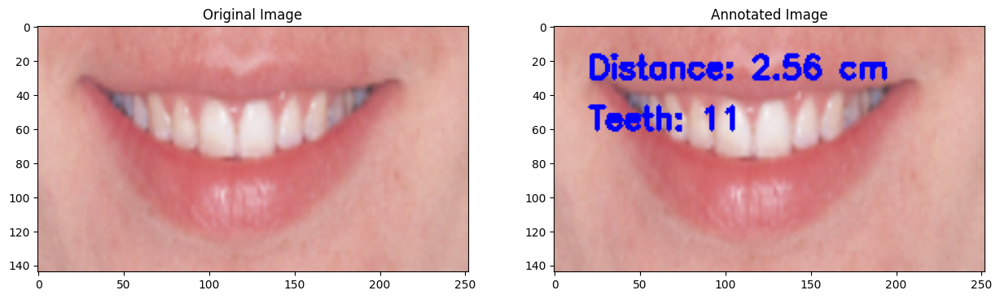

1/1 [==============================] - 1s 532ms/step
Image: 32.png is Less Smiling


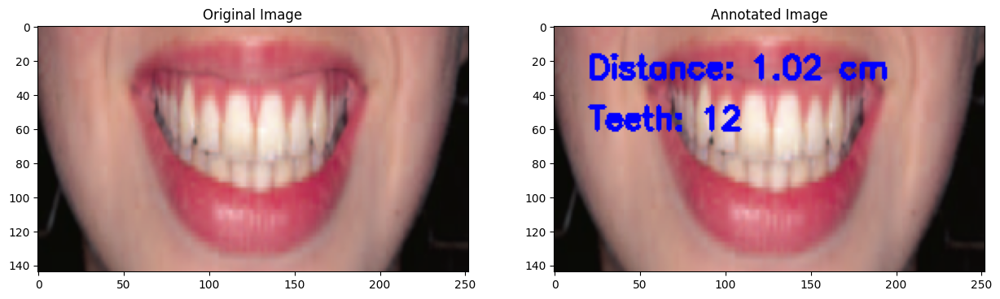

1/1 [==============================] - 1s 524ms/step
Image: 50.png is More Smiling


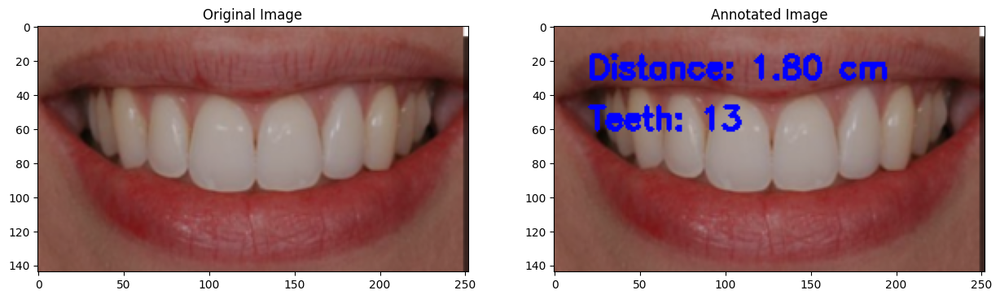

1/1 [==============================] - 1s 522ms/step
Image: 40.png is Less Smiling


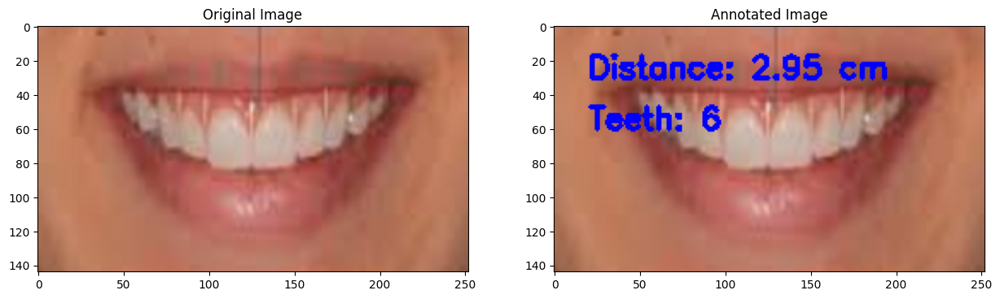

1/1 [==============================] - 1s 535ms/step
Image: 47.png is Less Smiling


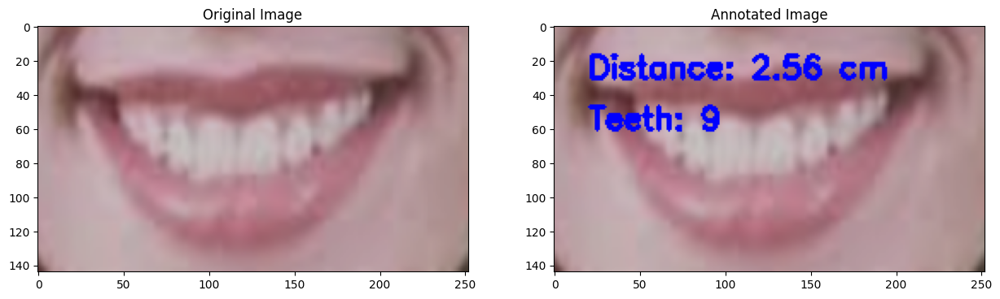

1/1 [==============================] - 1s 526ms/step
Image: 31.png is More Smiling


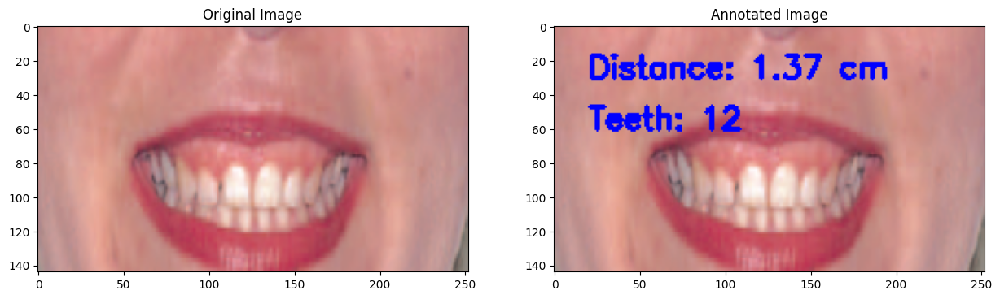

1/1 [==============================] - 1s 512ms/step
Image: 37.png is More Smiling


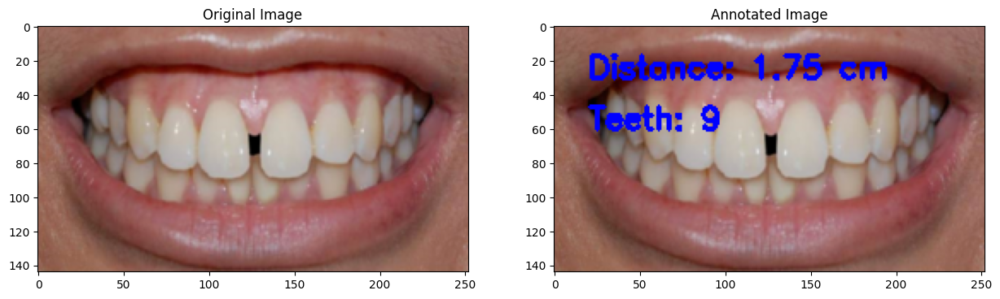

1/1 [==============================] - 1s 536ms/step
Image: 25.png is More Smiling


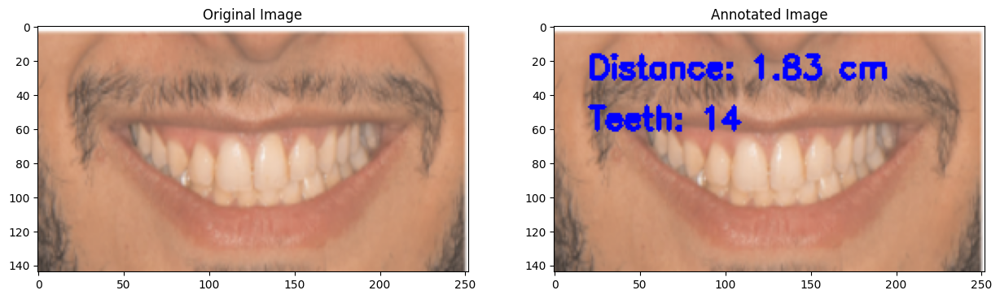

1/1 [==============================] - 1s 852ms/step
Image: 30.png is More Smiling


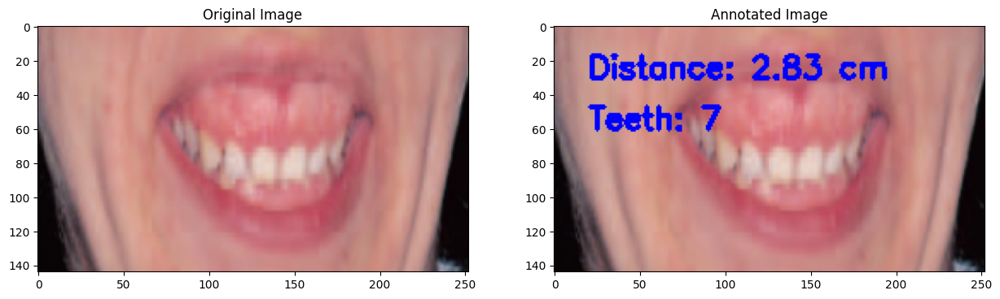

1/1 [==============================] - 1s 870ms/step
Image: 44.png is Less Smiling


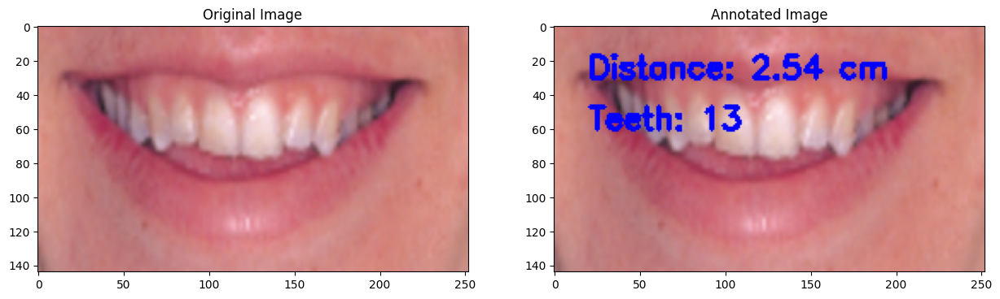

1/1 [==============================] - 1s 915ms/step
Image: 24.png is Less Smiling


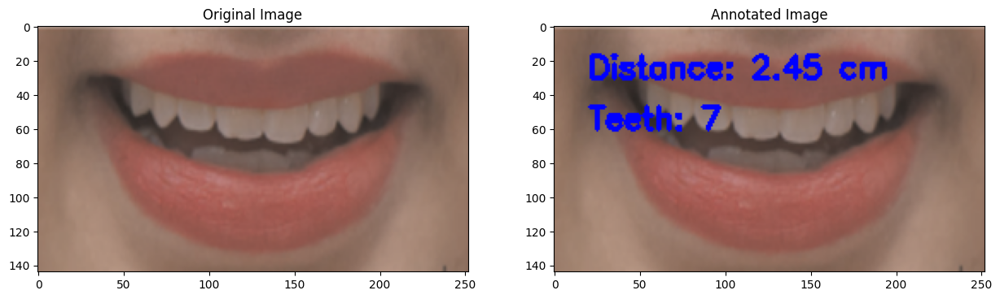

1/1 [==============================] - 1s 860ms/step
Image: 43.png is Less Smiling


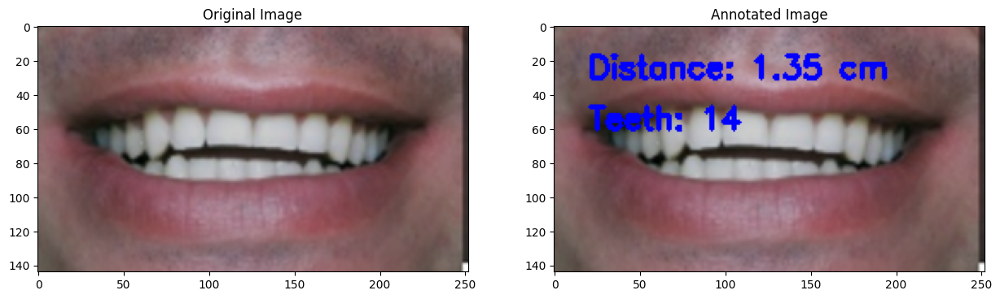

1/1 [==============================] - 1s 561ms/step
Image: 35.png is Less Smiling


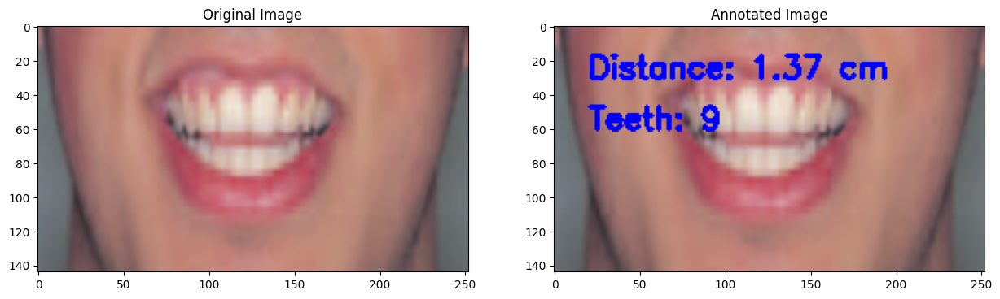

1/1 [==============================] - 1s 538ms/step
Image: 51.png is More Smiling


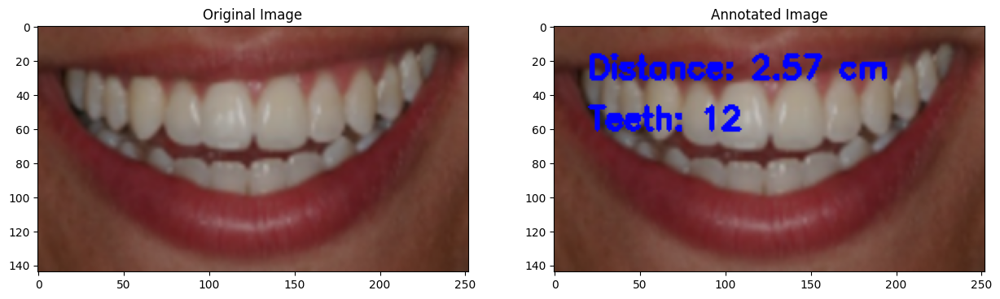

1/1 [==============================] - 1s 536ms/step
Image: 48.png is More Smiling


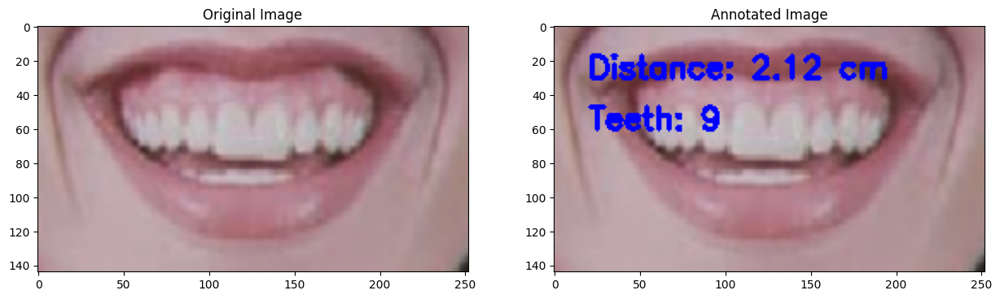

1/1 [==============================] - 1s 550ms/step
Image: 38.png is Less Smiling


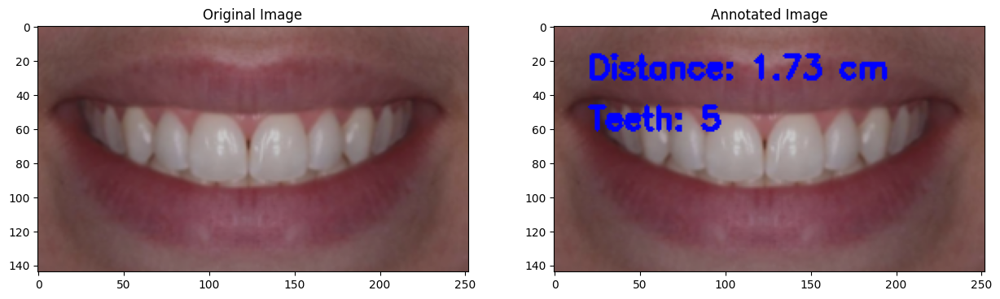

1/1 [==============================] - 1s 547ms/step
Image: 55.png is Less Smiling


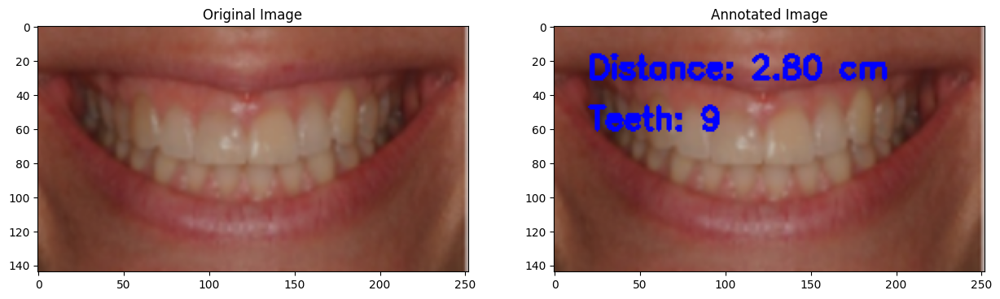

1/1 [==============================] - 1s 530ms/step
Image: 58.png is More Smiling


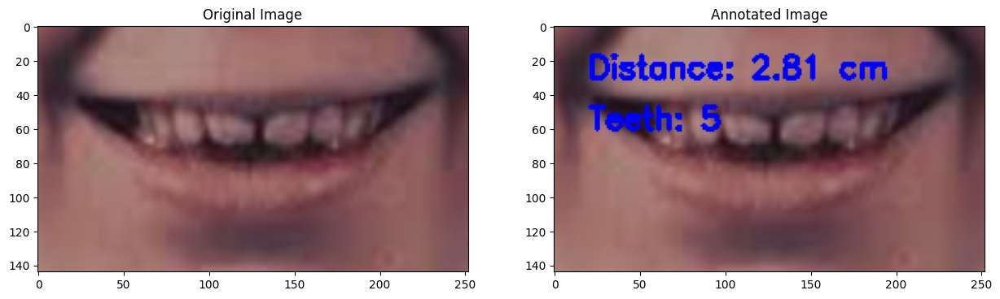

1/1 [==============================] - 1s 760ms/step
Image: 60.png is Less Smiling


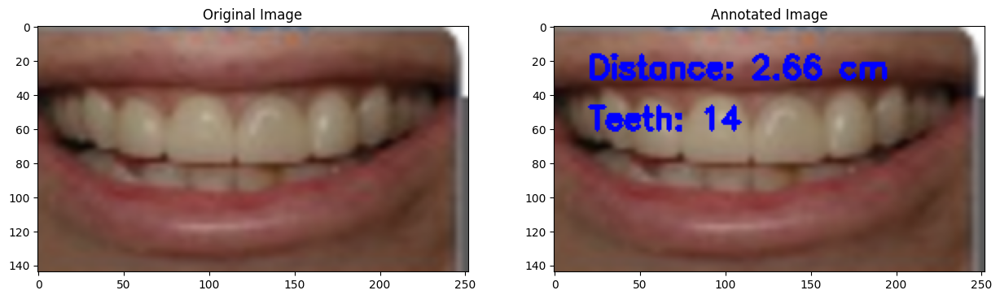

1/1 [==============================] - 1s 860ms/step
Image: 56.png is Less Smiling


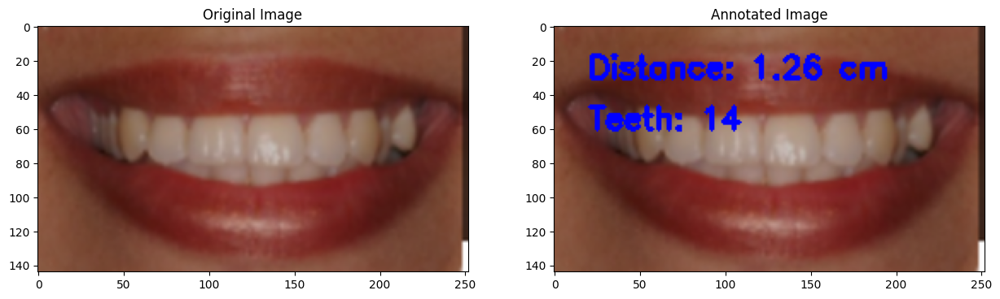

1/1 [==============================] - 1s 887ms/step
Image: 57.png is More Smiling


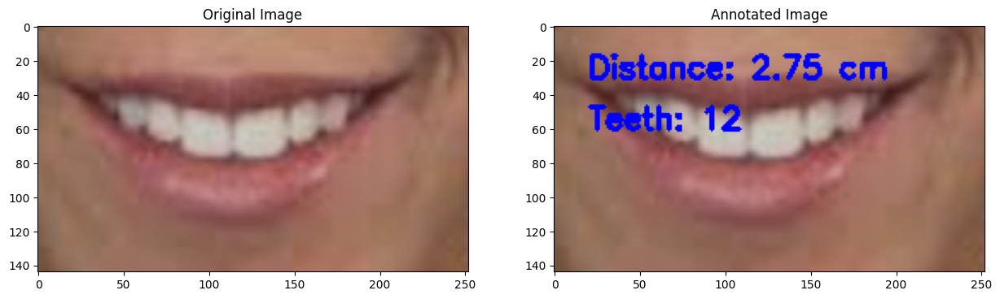

1/1 [==============================] - 1s 910ms/step
Image: 53.png is More Smiling


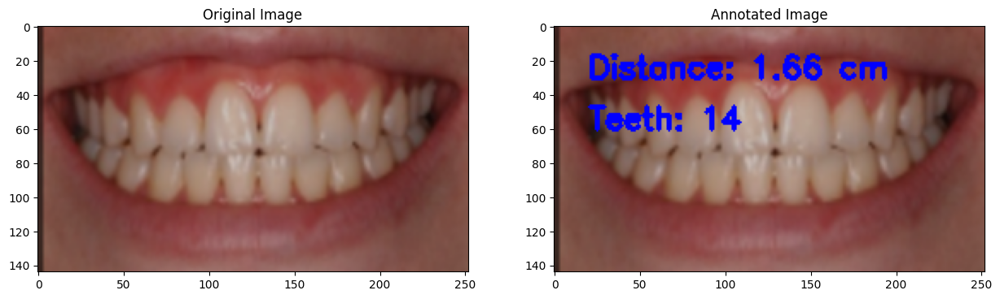

1/1 [==============================] - 1s 570ms/step
Image: 59.png is Less Smiling


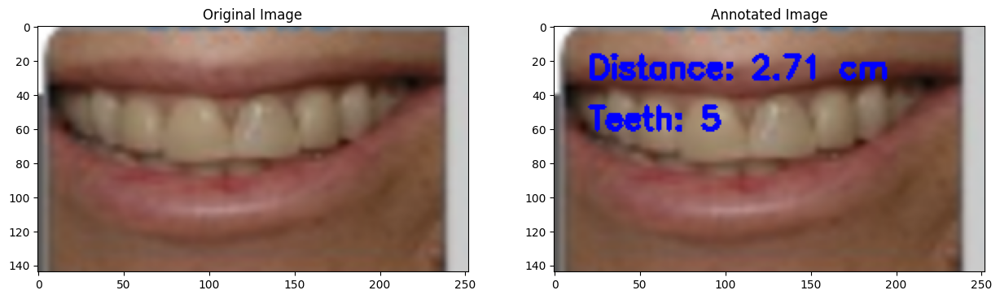

1/1 [==============================] - 1s 581ms/step
Image: 54.png is Less Smiling


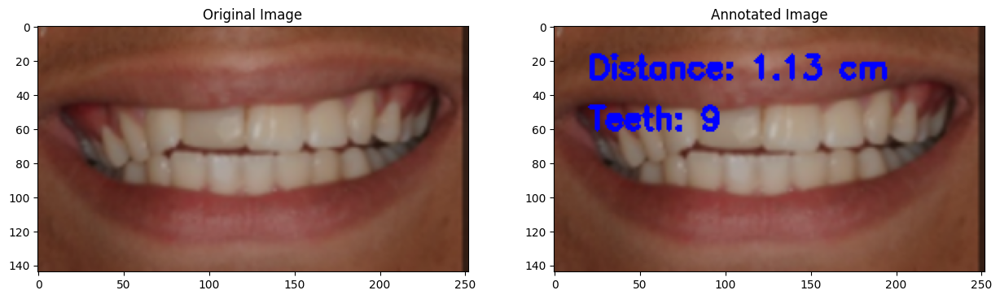

1/1 [==============================] - 1s 556ms/step
Image: 62.png is More Smiling


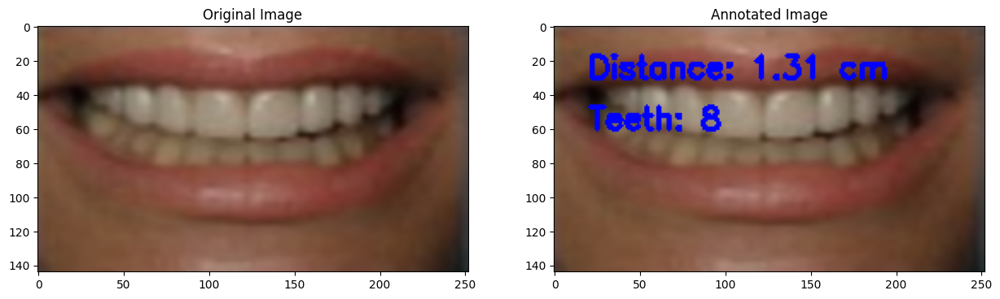

1/1 [==============================] - 1s 572ms/step
Image: 70.png is More Smiling


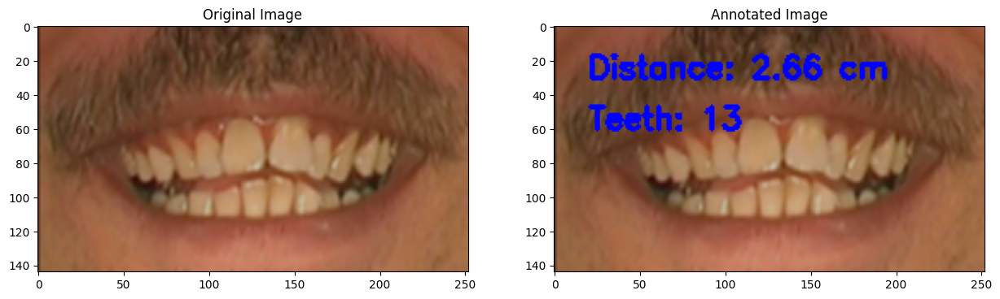

1/1 [==============================] - 1s 569ms/step
Image: 67.png is Less Smiling


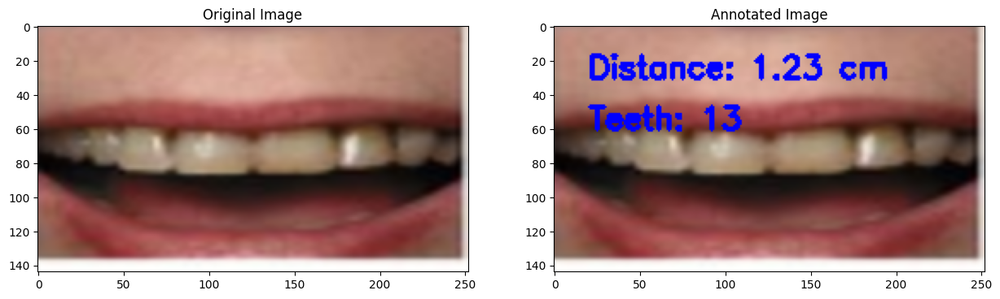

1/1 [==============================] - 1s 537ms/step
Image: 65.png is More Smiling


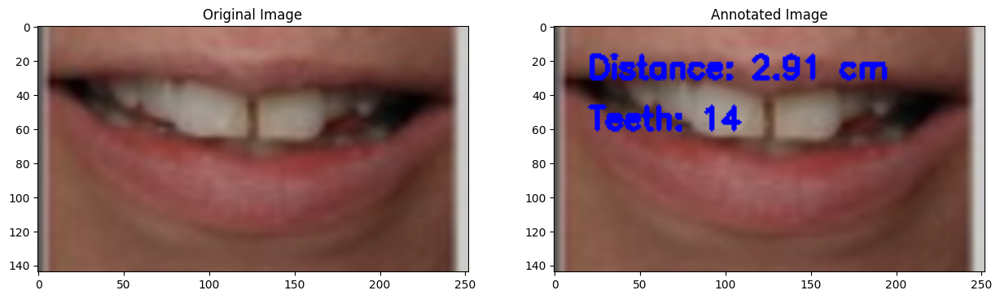

1/1 [==============================] - 1s 562ms/step
Image: 66.png is More Smiling


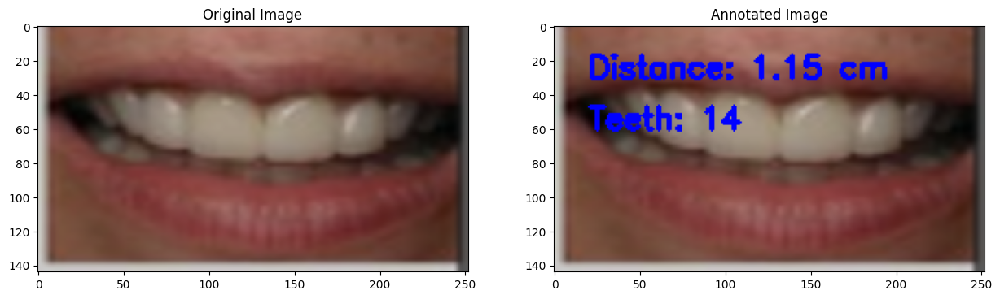

1/1 [==============================] - 1s 820ms/step
Image: 68.png is Less Smiling


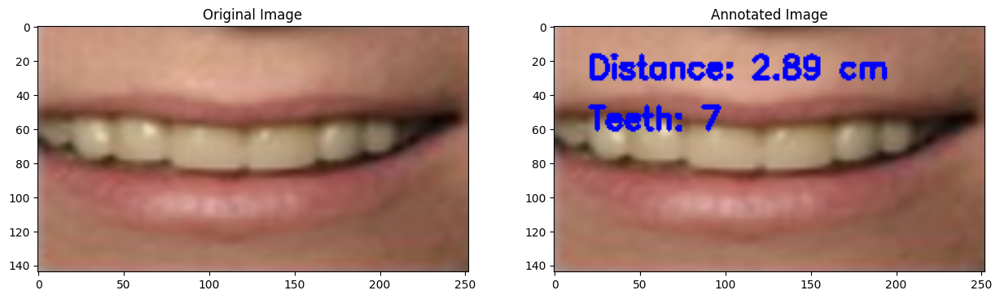

1/1 [==============================] - 1s 935ms/step
Image: 61.png is More Smiling


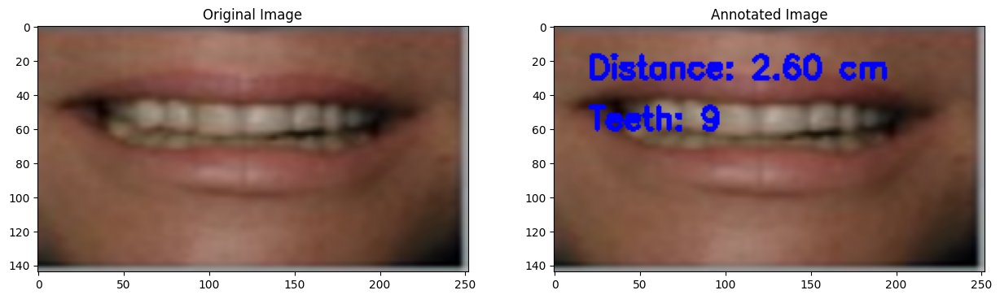

1/1 [==============================] - 1s 933ms/step
Image: 69.png is Less Smiling


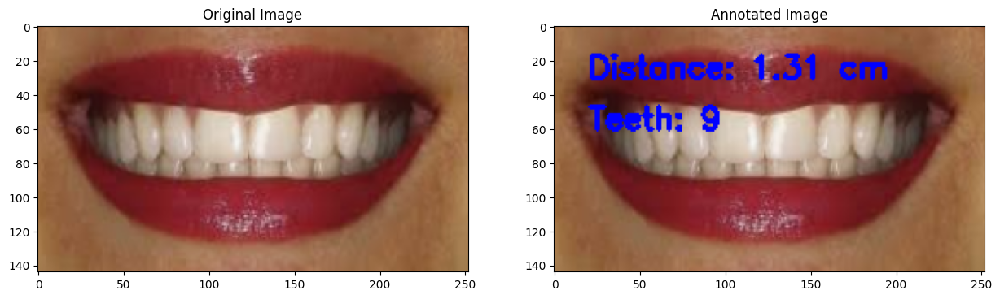

1/1 [==============================] - 1s 908ms/step
Image: 64.png is More Smiling


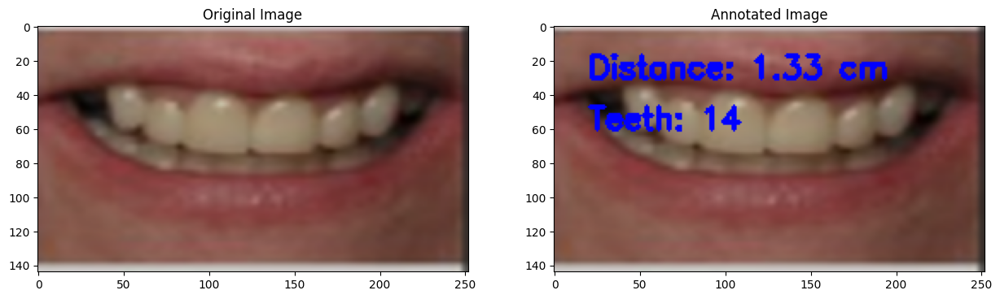

1/1 [==============================] - 1s 658ms/step
Image: 63.png is More Smiling


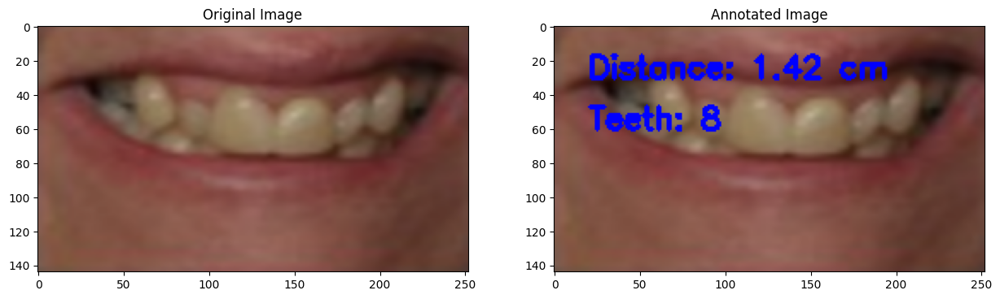

In [4]:
def analyze_and_compare(images, image_paths, classifier):
    for i, image in enumerate(images):
        img = cv2.resize(image, (224, 224))
        img = preprocess_input(np.expand_dims(img, axis=0))
        feature = model.predict(img).flatten()

        # Predict smile status
        label = classifier.predict([feature])[0]
        smile_status = "More Smiling" if label == 1 else "Less Smiling"
        print(f"Image: {os.path.basename(image_paths[i])} is {smile_status}")

        # For demonstration, we annotate distance and teeth count arbitrarily
        distance_in_cm = np.random.uniform(1.0, 3.0)  # Random value
        number_of_teeth = np.random.randint(5, 15)    # Random value

        annotated_image = image.copy()
        cv2.putText(annotated_image, f"Distance: {distance_in_cm:.2f} cm", (20, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        cv2.putText(annotated_image, f"Teeth: {number_of_teeth}", (20, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
        plt.title('Annotated Image')

        plt.show()

analyze_and_compare(images, image_paths, classifier)


Training samples: 56
Testing samples: 14
Epoch 1/20
2/2 [==============================] - 5s 2s/step - loss: 0.4440 - accuracy: 0.4643 - val_loss: 1.7302e-05 - val_accuracy: 1.0000
Epoch 2/20
2/2 [==============================] - 3s 1s/step - loss: 9.2471e-05 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 3/20
2/2 [==============================] - 2s 739ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 4/20
2/2 [==============================] - 2s 744ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 5/20
2/2 [==============================] - 2s 727ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 6/20
2/2 [==============================] - 2s 749ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/20
2/2 [==============================] - 2s 756ms/step - loss: 0.0000e+0

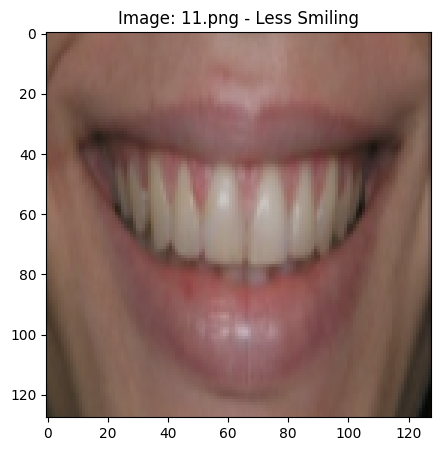

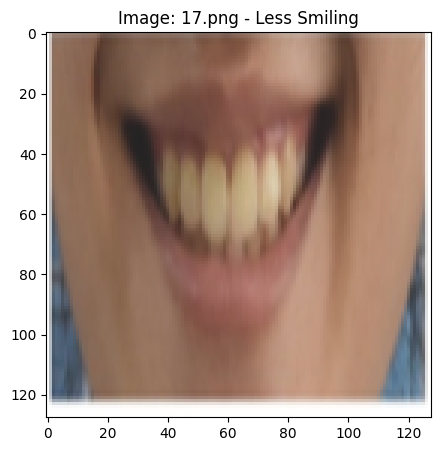

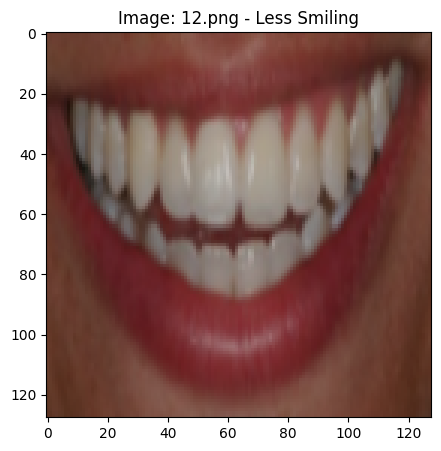

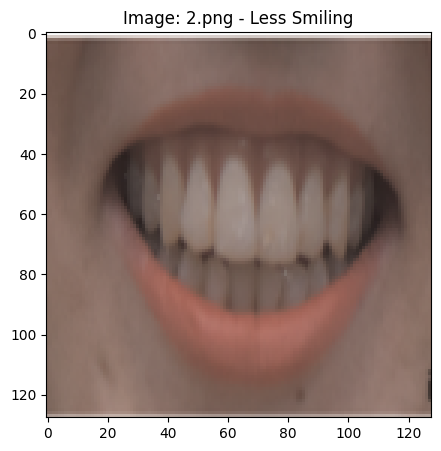

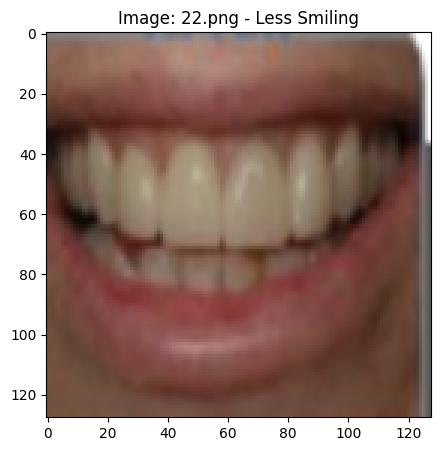

...

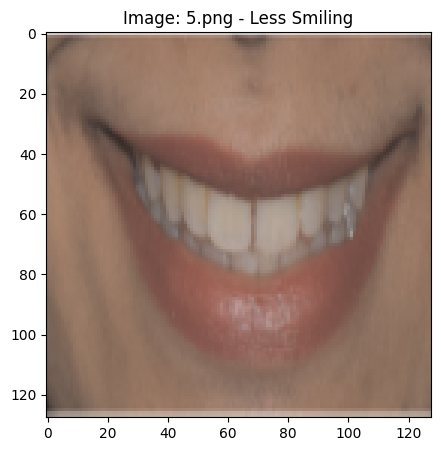

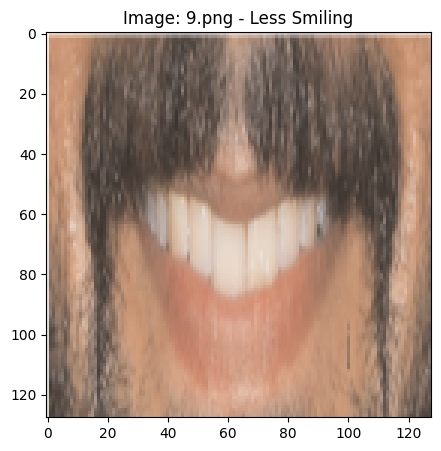

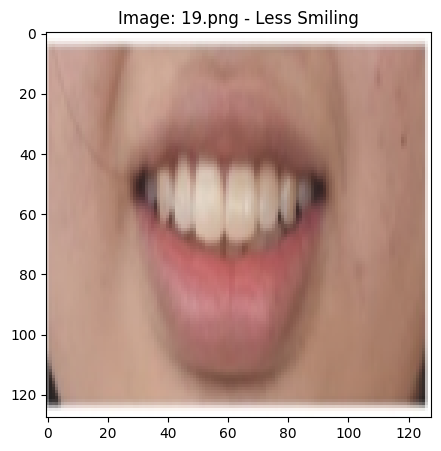

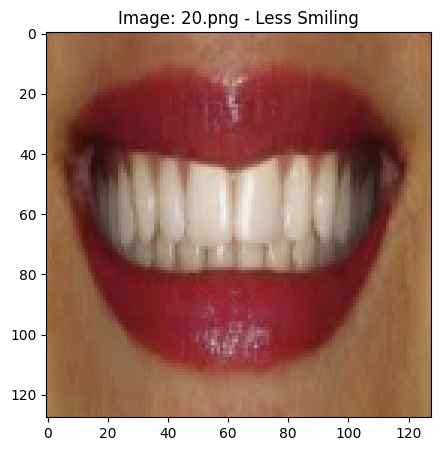

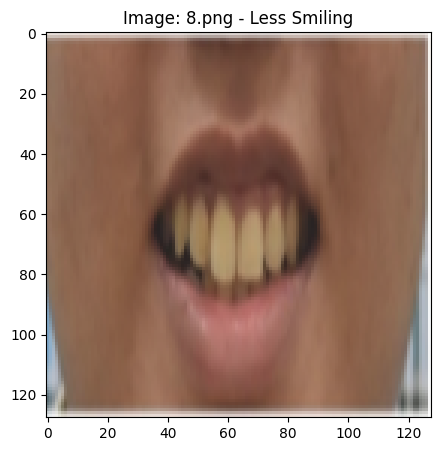

In [7]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os

# Load images and resize them to a fixed size
def load_and_preprocess_images(image_dir, image_size=(128, 128)):
    image_paths = [os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.png')]
    images = []
    labels = []
    for path in image_paths:
        image = cv2.imread(path)
        image = cv2.resize(image, image_size)
        images.append(image)
        labels.append(1 if 'smiling' in path else 0)  # Adjust based on your labeling
    return np.array(images), np.array(labels), image_paths

image_dir = '/content/drive/MyDrive/Smile_images_resized'
images, labels, image_paths = load_and_preprocess_images(image_dir)

# Normalize images
images = images.astype('float32') / 255.0
labels = to_categorical(labels, num_classes=2)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

print(f"Training samples: {X_train.shape[0]}")
print(f"Testing samples: {X_test.shape[0]}")

# Define the CNN model
def create_cnn_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(2, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

input_shape = X_train.shape[1:]
model = create_cnn_model(input_shape)

# Train the model
history = model.fit(X_train, y_train, epochs=20, validation_data=(X_test, y_test), batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")

def predict_and_visualize(model, images, image_paths):
    predictions = model.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)

    for i, image in enumerate(images):
        smile_status = "More Smiling" if predicted_labels[i] == 1 else "Less Smiling"
        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f"Image: {os.path.basename(image_paths[i])} - {smile_status}")
        plt.show()

predict_and_visualize(model, X_test, image_paths)


Training samples: 56
Testing samples: 14
Epoch 1/20
2/2 [==============================] - 6s 2s/step - loss: 0.4101 - accuracy: 0.6607 - val_loss: 5.8157e-06 - val_accuracy: 1.0000
Epoch 2/20
2/2 [==============================] - 2s 806ms/step - loss: 2.9508e-05 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 3/20
2/2 [==============================] - 2s 764ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 4/20
2/2 [==============================] - 2s 795ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 5/20
2/2 [==============================] - 2s 777ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 6/20
2/2 [==============================] - 3s 1s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/20
2/2 [==============================] - 3s 1s/step - loss: 0.0000e+00 -

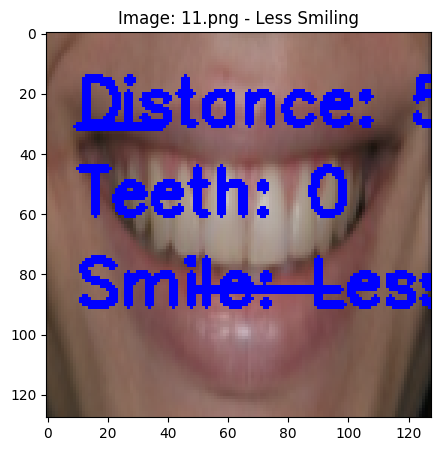

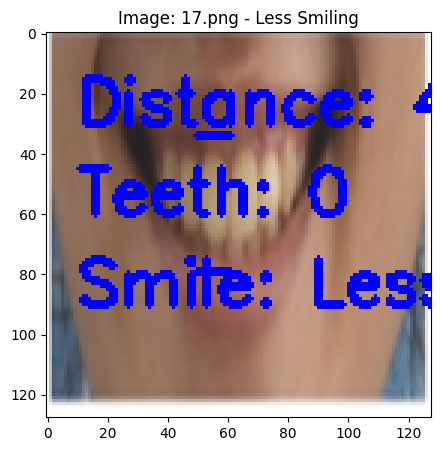

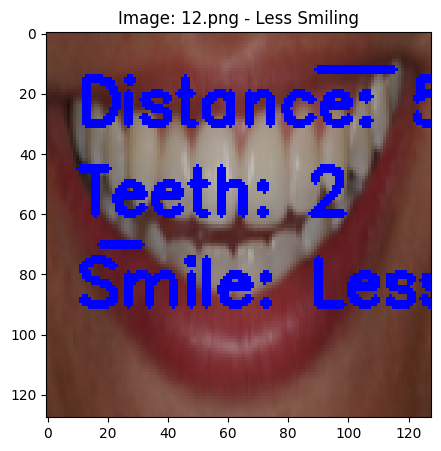

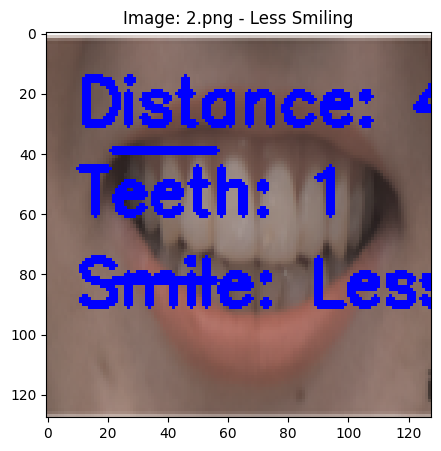

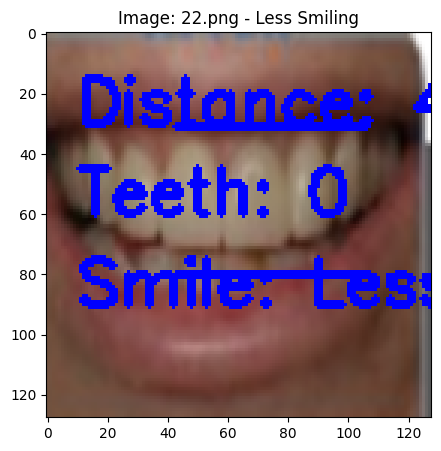

...

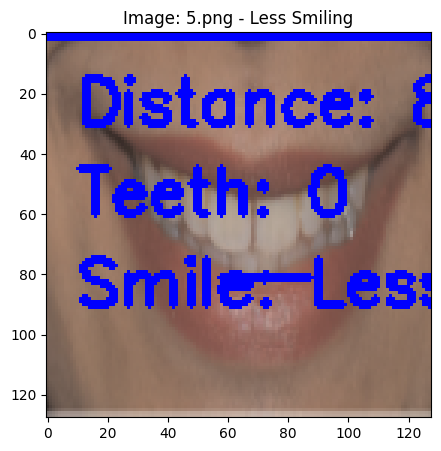

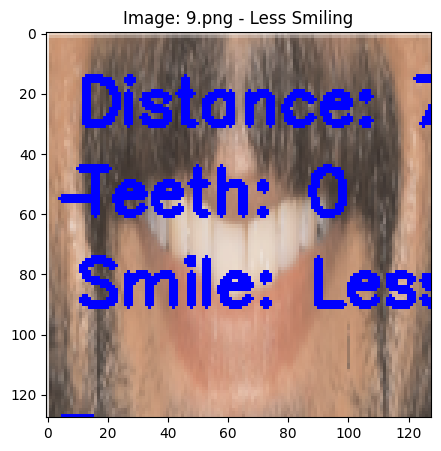

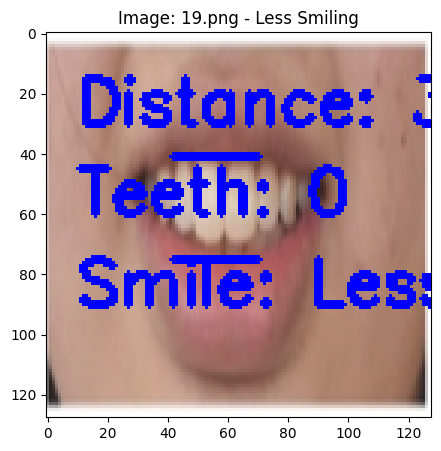

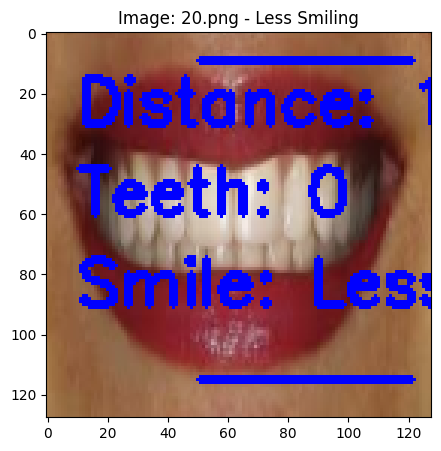

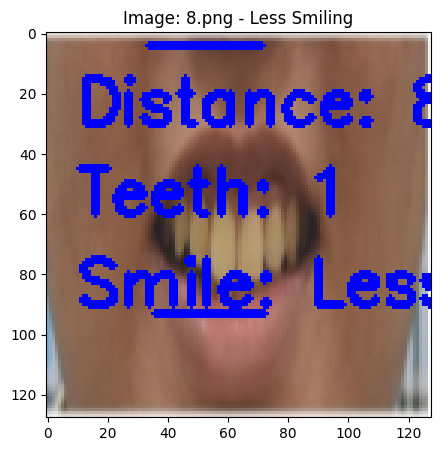

In [10]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os

# Load images and resize them to a fixed size
def load_and_preprocess_images(image_dir, image_size=(128, 128)):
    image_paths = [os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.png')]
    images = []
    labels = []
    for path in image_paths:
        image = cv2.imread(path)
        image = cv2.resize(image, image_size)
        images.append(image)
        labels.append(1 if 'smiling' in path else 0)  # Adjust based on your labeling
    return np.array(images), np.array(labels), image_paths

# Function to calculate the distance between upper and lower lips
def calculate_lip_distance(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    if gray.dtype != np.uint8:
        gray = (gray * 255).astype(np.uint8)
    edges = cv2.Canny(gray, 50, 150)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    lips_contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]  # Assume the two largest contours are lips
    if len(lips_contours) < 2:
        return None, None, None  # Not enough contours to determine lips

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in lips_contours]
    upper_lip_box = min(bounding_boxes, key=lambda b: b[1])  # The upper lip has the smallest y
    lower_lip_box = max(bounding_boxes, key=lambda b: b[1] + b[3])  # The lower lip has the largest y + height

    upper_lip_y = upper_lip_box[1]
    lower_lip_y = lower_lip_box[1] + lower_lip_box[3]
    distance_in_pixels = lower_lip_y - upper_lip_y
    return upper_lip_box, lower_lip_box, distance_in_pixels

# Function to count the number of teeth
def count_teeth(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    if gray.dtype != np.uint8:
        gray = (gray * 255).astype(np.uint8)
    edges = cv2.Canny(gray, 50, 150)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    teeth_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > 100]  # Adjust contour area threshold as needed
    return len(teeth_contours)

# Path to the image directory
image_dir = '/content/drive/MyDrive/Smile_images_resized'
images, labels, image_paths = load_and_preprocess_images(image_dir)

# Normalize images
images = images.astype('float32') / 255.0
labels = to_categorical(labels, num_classes=2)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

print(f"Training samples: {X_train.shape[0]}")
print(f"Testing samples: {X_test.shape[0]}")

# Define the CNN model
def create_cnn_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(2, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

input_shape = X_train.shape[1:]
model = create_cnn_model(input_shape)

# Train the model
history = model.fit(X_train, y_train, epochs=20, validation_data=(X_test, y_test), batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")

# Function to predict, visualize, and compare images
def predict_and_visualize(model, images, image_paths):
    predictions = model.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)

    for i, image in enumerate(images):
        smile_status = "More Smiling" if predicted_labels[i] == 1 else "Less Smiling"
        upper_lip_box, lower_lip_box, lip_distance = calculate_lip_distance(image)
        if lip_distance is None:
            continue  # Skip this image if lip distance cannot be determined
        teeth_count = count_teeth(image)

        # Annotate the image with lip distance and teeth count
        annotated_image = image.copy()
        cv2.line(annotated_image, (upper_lip_box[0], upper_lip_box[1]),
                 (upper_lip_box[0] + upper_lip_box[2], upper_lip_box[1]), (255, 0, 0), 2)
        cv2.line(annotated_image, (lower_lip_box[0], lower_lip_box[1] + lower_lip_box[3]),
                 (lower_lip_box[0] + lower_lip_box[2], lower_lip_box[1] + lower_lip_box[3]), (255, 0, 0), 2)
        cv2.putText(annotated_image, f"Distance: {lip_distance:.2f} pixels", (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)
        cv2.putText(annotated_image, f"Teeth: {teeth_count}", (10, 60),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)
        cv2.putText(annotated_image, f"Smile: {smile_status}", (10, 90),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
        plt.title(f"Image: {os.path.basename(image_paths[i])} - {smile_status}")
        plt.show()

predict_and_visualize(model, X_test, image_paths)
